# Ujian Modul 2 - Purwadhika Data Science JC Program

## Context - Taken from Kaggle
Did you know that claims can be filed against TSA? Sometimes US Terminal Security Agency (TSA) makes mistakes. People can get hurt and property can be damaged, lost, or stolen. Claims are generally filed against TSA for personal injuries and lost or damaged property during screenings and they keep records of every claim!

### Content
The dataset includes claims filed between 2002 through 2015.

1. Claim Number
1. Date Received
1. Incident Date
1. Airport Code
1. Airport Name
1. Airline Name
1. Claim Type
1. Claim Site
1. Item
1. Claim Amount
1. Status
1. Close Amount
1. Disposition

This data is coming from the Kaggle Dataset that contain the data of claim that have been filed into the TSA. We would try to explore the data and clean the data partially (we would not clean and analyze everything as it would take more time than necessary) and we would only use 25% data from the original dataset.

This exam scoring would be explained below:

- This Notebook would have total score of 80 (+ 10 Bonus POINT for Bonus Question), which consist of:
    - 40 POINT for the Question part (10 point for each question)
    - 40 POINT for the preprocessing part by following the guide
- The Dashboard Tableau would yield 20 POINT
- The Maximum Score would be still 100, Bonus Question is just a Bonus. Work it if you have an extra time and already sure about all your other answer (or not sure about the other question, and need this bonus question to help)

When you finish, upload your notebook contain all the answer AND the Tableau Dashboard Link to regitaz@gmail.com. You do not need to upload the .csv file. 

Try to read the data and show all the important info first. For starter, try to understand what each column represent.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [3]:
df = pd.read_csv('C:/Users/alvim/OneDrive/Desktop/tsa_claims.csv')

In [4]:
df.head()

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
0,0909802M,4-Jan-02,12/12/2002 0:00,EWR,Newark International Airport,Continental Airlines,Property Damage,Checkpoint,Other,$350.00,Approved,$350.00,Approve in Full
1,0202417M,2-Feb-02,1/16/2004 0:00,SEA,Seattle-Tacoma International,NaN,Property Damage,Checked Baggage,Luggage (all types including footlockers),$100.00,Settled,$50.00,Settle
2,0202445M,4-Feb-02,11/26/2003 0:00,STL,Lambert St. Louis International,American Airlines,Property Damage,Checked Baggage,Cell Phones,$278.88,Settled,$227.92,Settle
3,0909816M,7-Feb-02,1/6/2003 0:00,MIA,Miami International Airport,American Airlines,Property Damage,Checkpoint,Luggage (all types including footlockers),$50.00,Approved,$50.00,Approve in Full
4,2005032379513,18-Feb-02,2/5/2005 0:00,MCO,Orlando International Airport,Delta (Song),Property Damage,Checkpoint,Baby - Strollers; car seats; playpen; etc.,$84.79,Approved,$84.79,Approve in Full


In [5]:
df.tail()

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
204262,2015120427297,20-Nov-15,16-Oct-15,-,-,-,Property Damage,Checked Baggage,Baggage/Cases/Purses; Books; Magazines & Other...,-,-,NaN,NaN
204263,2015123027969,17-Dec-15,2-Dec-15,-,-,-,Property Damage,Checked Baggage,Audio/Video; Home Decor,-,-,NaN,NaN
204264,2016010428072,22-Dec-15,20-Dec-15,-,-,-,Passenger Property Loss,Checked Baggage,Clothing,-,-,NaN,NaN
204265,2016011328300,30-Dec-15,28-Dec-15,-,-,-,Passenger Property Loss,Checked Baggage,Tools & Home Improvement Supplies,-,-,NaN,NaN
204266,2015123128015,31-Dec-15,23-Nov-15,-,-,-,Passenger Property Loss,Checkpoint,Personal Accessories,-,-,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204267 entries, 0 to 204266
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Claim Number   204267 non-null  object
 1   Date Received  204004 non-null  object
 2   Incident Date  202084 non-null  object
 3   Airport Code   195743 non-null  object
 4   Airport Name   195743 non-null  object
 5   Airline Name   169893 non-null  object
 6   Claim Type     196354 non-null  object
 7   Claim Site     203527 non-null  object
 8   Item           200301 non-null  object
 9   Claim Amount   200224 non-null  object
 10  Status         204262 non-null  object
 11  Close Amount   135315 non-null  object
 12  Disposition    131359 non-null  object
dtypes: object(13)
memory usage: 20.3+ MB


In [7]:
df.describe()

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
count,204267,204004,202084,195743,195743,169893,196354,203527,200301,200224,204262,135315,131359
unique,204258,4007,26807,465,485,318,11,6,4704,36117,15,17162,3
top,2013050203487,5-Dec-03,12/27/2004 0:00,LAX,John F. Kennedy International,American Airlines,Passenger Property Loss,Checked Baggage,Other,$0.00,Denied,$0.00,Deny
freq,2,682,144,9596,9232,17553,117868,159753,36908,28445,68339,71546,68382


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,Claim Number,object,0,0.00,51065,"[2007052325856, 2010073174251]"
1,Date Received,object,70,0.14,3522,"[10-Apr-09, 31-Jan-11]"
2,Incident Date,object,570,1.12,10788,"[11/20/2008 0:00, 10/8/2005 0:00]"
3,Airport Code,object,2052,4.02,405,"[UNV, IND]"
4,Airport Name,object,2052,4.02,419,"[Huntsville International Airport, Santa Barba..."
5,Airline Name,object,8555,16.75,243,"[Westjet Airlines Ltd, Lan Airlines]"
6,Claim Type,object,1960,3.84,8,"[Employee Loss (MPCECA), -]"
7,Claim Site,object,190,0.37,6,"[Checkpoint, -]"
8,Item,object,1012,1.98,1854,"[Clocks - Inexpensive ($75.00 or less); Other,..."
9,Claim Amount,object,992,1.94,13248,"[$250.38 , $2;858.27 ]"


If you notice, there is '-' value that become a filler for an empty value. Replace all these '-' in every column into NaN object (np.nan) 

In [12]:
df.replace('-', np.nan, inplace= True)

Try to convert the Date Received and Incident Date data type into Datetime object. For the Incident Date columns, if you directly try to convert the column into datetime object it would raise an error notice. In that case, try to show the dataframe with the Incident Date column contain all the error.  

In [9]:
df['Date Received'] = pd.to_datetime(df['Date Received'])

In [10]:
df['Incident Date'] = pd.to_datetime(df['Incident Date'])

OutOfBoundsDatetime: Out of bounds nanosecond timestamp: 300-09-03 00:00:00

In [13]:
df= df.loc[df['Incident Date'].str.len() > 10]
df

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
0,0909802M,2002-01-04,12/12/2002 0:00,EWR,Newark International Airport,Continental Airlines,Property Damage,Checkpoint,Other,$350.00,Approved,$350.00,Approve in Full
1,0202417M,2002-02-02,1/16/2004 0:00,SEA,Seattle-Tacoma International,NaN,Property Damage,Checked Baggage,Luggage (all types including footlockers),$100.00,Settled,$50.00,Settle
2,0202445M,2002-02-04,11/26/2003 0:00,STL,Lambert St. Louis International,American Airlines,Property Damage,Checked Baggage,Cell Phones,$278.88,Settled,$227.92,Settle
3,0909816M,2002-02-07,1/6/2003 0:00,MIA,Miami International Airport,American Airlines,Property Damage,Checkpoint,Luggage (all types including footlockers),$50.00,Approved,$50.00,Approve in Full
4,2005032379513,2002-02-18,2/5/2005 0:00,MCO,Orlando International Airport,Delta (Song),Property Damage,Checkpoint,Baby - Strollers; car seats; playpen; etc.,$84.79,Approved,$84.79,Approve in Full
...,...,...,...,...,...,...,...,...,...,...,...,...,...
186737,2014010710602,2013-12-31,12/13/2013 0:00,ATL,Hartsfield-Jackson Atlanta International Airport,Delta Air Lines,Property Damage,Checked Baggage,Clothing,NaN,NaN,NaN,NaN
186738,2014010710603,2013-12-31,12/29/2013 0:00,IAH,Houston - George Bush Intercontinental Airport,UAL,Passenger Property Loss,Checked Baggage,Cameras; Other; Other,NaN,NaN,NaN,NaN
186739,2014010810606,2013-12-31,12/22/2013 11:00,BOS,Boston (Logan) International Airport,Jet Blue,Passenger Property Loss,Checked Baggage,Other,NaN,NaN,NaN,NaN
186740,2014010810614,2013-12-31,12/16/2013 18:00,CID,Eastern Iowa,Allegiant Air,Property Damage,Checkpoint,Personal Electronics,NaN,NaN,NaN,NaN


For the data in the Incident Date column that contain error, replace the year with the year that come from the Date Received column and replace the Incident Date data type into datetime object

In [14]:
df.replace(df['Incident Date'][7:10], df['Date Received'][:3])

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
0,0909802M,2002-01-04,12/12/2002 0:00,EWR,Newark International Airport,Continental Airlines,Property Damage,Checkpoint,Other,$350.00,Approved,$350.00,Approve in Full
1,0202417M,2002-02-02,1/16/2004 0:00,SEA,Seattle-Tacoma International,NaN,Property Damage,Checked Baggage,Luggage (all types including footlockers),$100.00,Settled,$50.00,Settle
2,0202445M,2002-02-04,11/26/2003 0:00,STL,Lambert St. Louis International,American Airlines,Property Damage,Checked Baggage,Cell Phones,$278.88,Settled,$227.92,Settle
3,0909816M,2002-02-07,1/6/2003 0:00,MIA,Miami International Airport,American Airlines,Property Damage,Checkpoint,Luggage (all types including footlockers),$50.00,Approved,$50.00,Approve in Full
4,2005032379513,2002-02-18,2/5/2005 0:00,MCO,Orlando International Airport,Delta (Song),Property Damage,Checkpoint,Baby - Strollers; car seats; playpen; etc.,$84.79,Approved,$84.79,Approve in Full
...,...,...,...,...,...,...,...,...,...,...,...,...,...
186737,2014010710602,2013-12-31,12/13/2013 0:00,ATL,Hartsfield-Jackson Atlanta International Airport,Delta Air Lines,Property Damage,Checked Baggage,Clothing,NaN,NaN,NaN,NaN
186738,2014010710603,2013-12-31,12/29/2013 0:00,IAH,Houston - George Bush Intercontinental Airport,UAL,Passenger Property Loss,Checked Baggage,Cameras; Other; Other,NaN,NaN,NaN,NaN
186739,2014010810606,2013-12-31,12/22/2013 11:00,BOS,Boston (Logan) International Airport,Jet Blue,Passenger Property Loss,Checked Baggage,Other,NaN,NaN,NaN,NaN
186740,2014010810614,2013-12-31,12/16/2013 18:00,CID,Eastern Iowa,Allegiant Air,Property Damage,Checkpoint,Personal Electronics,NaN,NaN,NaN,NaN


In [15]:
df['Incident Date'] = pd.to_datetime(df['Incident Date'], errors = 'coerce')

Check the data info and the dataframe that previously contain the error in their data to see if the data have been properly corrected.

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 184561 entries, 0 to 186741
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Claim Number   184561 non-null  object        
 1   Date Received  184422 non-null  datetime64[ns]
 2   Incident Date  184397 non-null  datetime64[ns]
 3   Airport Code   177183 non-null  object        
 4   Airport Name   177183 non-null  object        
 5   Airline Name   148894 non-null  object        
 6   Claim Type     177929 non-null  object        
 7   Claim Site     183817 non-null  object        
 8   Item           177950 non-null  object        
 9   Claim Amount   175042 non-null  object        
 10  Status         177612 non-null  object        
 11  Close Amount   134316 non-null  object        
 12  Disposition    130588 non-null  object        
dtypes: datetime64[ns](2), object(11)
memory usage: 24.7+ MB


In [17]:
df

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition
0,0909802M,2002-01-04,2002-12-12 00:00:00,EWR,Newark International Airport,Continental Airlines,Property Damage,Checkpoint,Other,$350.00,Approved,$350.00,Approve in Full
1,0202417M,2002-02-02,2004-01-16 00:00:00,SEA,Seattle-Tacoma International,NaN,Property Damage,Checked Baggage,Luggage (all types including footlockers),$100.00,Settled,$50.00,Settle
2,0202445M,2002-02-04,2003-11-26 00:00:00,STL,Lambert St. Louis International,American Airlines,Property Damage,Checked Baggage,Cell Phones,$278.88,Settled,$227.92,Settle
3,0909816M,2002-02-07,2003-01-06 00:00:00,MIA,Miami International Airport,American Airlines,Property Damage,Checkpoint,Luggage (all types including footlockers),$50.00,Approved,$50.00,Approve in Full
4,2005032379513,2002-02-18,2005-02-05 00:00:00,MCO,Orlando International Airport,Delta (Song),Property Damage,Checkpoint,Baby - Strollers; car seats; playpen; etc.,$84.79,Approved,$84.79,Approve in Full
...,...,...,...,...,...,...,...,...,...,...,...,...,...
186737,2014010710602,2013-12-31,2013-12-13 00:00:00,ATL,Hartsfield-Jackson Atlanta International Airport,Delta Air Lines,Property Damage,Checked Baggage,Clothing,NaN,NaN,NaN,NaN
186738,2014010710603,2013-12-31,2013-12-29 00:00:00,IAH,Houston - George Bush Intercontinental Airport,UAL,Passenger Property Loss,Checked Baggage,Cameras; Other; Other,NaN,NaN,NaN,NaN
186739,2014010810606,2013-12-31,2013-12-22 11:00:00,BOS,Boston (Logan) International Airport,Jet Blue,Passenger Property Loss,Checked Baggage,Other,NaN,NaN,NaN,NaN
186740,2014010810614,2013-12-31,2013-12-16 18:00:00,CID,Eastern Iowa,Allegiant Air,Property Damage,Checkpoint,Personal Electronics,NaN,NaN,NaN,NaN


Create a new feature of the day differences between claim received and the day of the incident called Day Differences, which contain the days that come from the Date Received column substracted by the Incident Date column (Date Received - Incident Date). We have this feature to see the time differences between when the claim made with the incident that happen.

In [18]:
df['Day Differences'] = df['Date Received']-df['Incident Date']
df['Day Differences'] = df['Day Differences'].dt.days


Lets try to visualize the distribution of the Day Differences with all the NaN just to be dropped first

Text(0.5, 1.0, 'Day Differences Distribution')

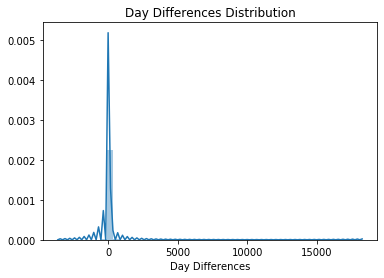

In [19]:
sns.distplot(df['Day Differences'].dropna()).set_title('Day Differences Distribution')

If we seen it from the plot, it seems there is days that less than 0 and even over than 1000. Lets try to visualize them both

Text(0.5, 1.0, 'Day Differences Distribution less than 0')

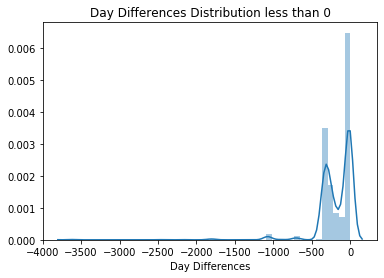

In [24]:
a = df.loc[df['Day Differences'].values < 0]
sns.distplot(a['Day Differences'].dropna()).set_title('Day Differences Distribution less than 0')

Text(0.5, 1.0, 'Day Differences Distribution over than 1000')

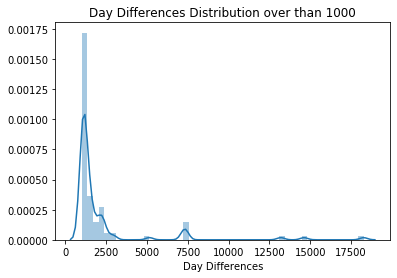

In [25]:
a = df.loc[df['Day Differences'].values > 1000]
sns.distplot(a['Day Differences'].dropna()).set_title('Day Differences Distribution over than 1000')

## Question

Why do you think there is day that way more than thousand days differences, and why some day differences are less than 0? (claim was made before the incident is like someone predicting a future after all).

In [ ]:
#an error or mistakes in inputing data may occur if day differences are less than 0 or over thousand days, but there could be unusual cases if the day differences are over thousand days

Remove the $ sign (some data need even more clean up by replacing the ; sign into . sign) from the Claim Amount columns and Close Amount columns, and change those columns datatype into float datatype

In [26]:
df['Claim Amount'] = df['Claim Amount'].str.replace('$', '')
df['Claim Amount'] = df['Claim Amount'].str.replace(';', '.')
df['Close Amount'] = df['Close Amount'].str.replace('$', '')
df['Close Amount'] = df['Close Amount'].str.replace(';', '.')

Create a new columns called Amount Differences by substract the Claim Amount with Close Amount columns

In [28]:
df['Claim Amount'] = pd.to_numeric(df['Claim Amount'], errors = 'coerce')
df['Close Amount'] = pd.to_numeric(df['Close Amount'], errors = 'coerce')
df['Amount Differences'] = df['Claim Amount'] - df['Close Amount']

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 184561 entries, 0 to 186741
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Claim Number        184561 non-null  object        
 1   Date Received       184422 non-null  datetime64[ns]
 2   Incident Date       184397 non-null  datetime64[ns]
 3   Airport Code        177183 non-null  object        
 4   Airport Name        177183 non-null  object        
 5   Airline Name        148894 non-null  object        
 6   Claim Type          177929 non-null  object        
 7   Claim Site          183817 non-null  object        
 8   Item                177950 non-null  object        
 9   Claim Amount        156377 non-null  float64       
 10  Status              177612 non-null  object        
 11  Close Amount        132315 non-null  float64       
 12  Disposition         130588 non-null  object        
 13  Day Differences     184258 no

In [30]:
df.head()

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition,Day Differences,Amount Differences
0,0909802M,2002-01-04,2002-12-12,EWR,Newark International Airport,Continental Airlines,Property Damage,Checkpoint,Other,350.00,Approved,350.00,Approve in Full,-342.0,0.00
1,0202417M,2002-02-02,2004-01-16,SEA,Seattle-Tacoma International,NaN,Property Damage,Checked Baggage,Luggage (all types including footlockers),100.00,Settled,50.00,Settle,-713.0,50.00
2,0202445M,2002-02-04,2003-11-26,STL,Lambert St. Louis International,American Airlines,Property Damage,Checked Baggage,Cell Phones,278.88,Settled,227.92,Settle,-660.0,50.96
3,0909816M,2002-02-07,2003-01-06,MIA,Miami International Airport,American Airlines,Property Damage,Checkpoint,Luggage (all types including footlockers),50.00,Approved,50.00,Approve in Full,-333.0,0.00
4,2005032379513,2002-02-18,2005-02-05,MCO,Orlando International Airport,Delta (Song),Property Damage,Checkpoint,Baby - Strollers; car seats; playpen; etc.,84.79,Approved,84.79,Approve in Full,-1083.0,0.00


Lets try to visualize it again similar to the Day Differences feature, but this time we would use the Amount Differences feature (still just drop the NaN first)

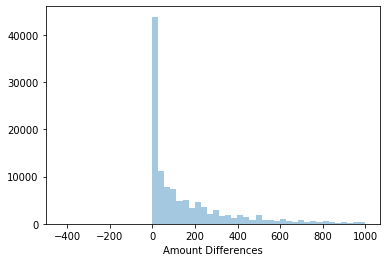

In [32]:
sns.distplot(df['Amount Differences'].dropna(), kde=False)

There is seems a differences in number that was way far. This time, lets use the Interquartile range (IQR) method to find the datapoint that seems to be an outlier based on the Amount Differences column, show the dataframe, and lets describe the Claim Amount and Close Amount column of the outlier dataframe based on the Amount Differences column

In [36]:
IQR = 218.3
df[df['Amount Differences'] > IQR]

,Claim Number,Date Received,Incident Date,Airport Code,Airport Name,Airline Name,Claim Type,Claim Site,Item,Claim Amount,Status,Close Amount,Disposition,Day Differences,Amount Differences
5,2005032479636,2002-02-18,2005-02-17 00:00:00,CAK,Akron-Canton Regional,Air Tran Airlines(do not use),Passenger Property Loss,Checked Baggage,Other,459.01,Settled,227.00,Settle,-1095.0,232.01
21,16410,2002-07-24,2002-07-10 00:00:00,SDF,Louisville International,Delta Air Lines,Passenger Property Loss,Checkpoint,Luggage (all types including footlockers),600.00,Settled,337.40,Settle,14.0,262.60
32,17201,2002-09-09,2002-08-19 00:00:00,PVD,TF Green Airport; Providence,Delta Air Lines,NaN,Other,Other,250.00,Denied,0.00,Deny,21.0,250.00
46,0909839M,2002-09-19,2002-12-31 00:00:00,DCA,Ronald Reagan Washington National Airport,NaN,Property Damage,Checkpoint,Cell Phones,250.00,Denied,0.00,Deny,-103.0,250.00
47,15542,2002-09-19,2002-07-01 00:00:00,BWI,Baltimore/Washington Intl Thurgood Marshall,Southwest Airlines,Property Damage,Other,Cameras - Digital,249.00,Denied,0.00,Deny,80.0,249.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145123,2010010867319,2009-12-30,2009-12-26 00:00:00,BHM,Birmingham International Airport,NaN,NaN,NaN,Electrical and Gas Appliances Minor - $200 or ...,348.00,Denied,0.00,Deny,4.0,348.00
145124,2010010867353,2009-12-30,2009-12-19 00:00:00,EWR,Newark International Airport,Continental Airlines,Passenger Property Loss,Checked Baggage,MP3 Players-(iPods; etc),358.00,Denied,0.00,Deny,11.0,358.00
145125,2010011267477,2009-12-30,2009-07-31 07:00:00,BUF,Buffalo Niagara International,Southwest Airlines,Property Damage,Checked Baggage,Luggage (all types including footlockers); Spo...,453.57,Denied,0.00,Deny,151.0,453.57
145130,2010010567190,2009-12-30,2009-12-19 18:30:00,SJC,Norman Y Mineta San Jose International,Southwest Airlines,Passenger Property Loss,Checked Baggage,Cameras - Digital; Cameras - Non-electronic (C...,445.06,Settled,99.53,Settle,10.0,345.53


In [37]:
df['Claim Amount'].describe()

count    156377.000000
mean        180.280442
std         210.787679
min           0.000000
25%          25.380000
50%         100.000000
75%         255.000000
max         999.990000
Name: Claim Amount, dtype: float64

In [38]:
df['Close Amount'].describe()

count    132315.000000
mean         63.466630
std         131.158693
min           0.000000
25%           0.000000
50%           0.000000
75%          64.500000
max         999.990000
Name: Close Amount, dtype: float64

It seems that Claim Amount feature really affecting lot of the differences that happen as 75% outlier data that in the Close Amount feature is still 0.

## Question

I assume that many of this big differences happen because these people tend to request for bigger money than what it should be. Do you agree or disagree with my assumption (With an assumption that not outlier is have normal amount differences and outlier have a really big amount differences)? why? Try to explain it with the data 

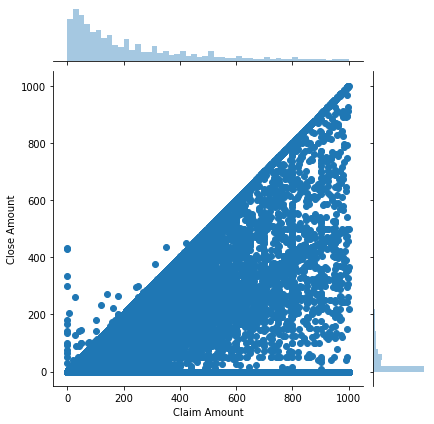

## Analysis

We have try to cleaning some of the data that we have, and now we could try to done few analysis from the data we had. Try to answer this following question.

### Question

1. Is there Any relationship between the Airport and/or the Airline with the number of the claim that happen and the Claim Type? Also why is there a NaN in the Claim Type column?

1. If you realize, there is many different classes in the Status and Disposition column. What pattern you could find in these 2 columns because of this classes variation? is there any relation with the other columns?

## Bonus Question

Could you find any interesting Insight from our data that you could explain? Try to explain it with the available data

In [44]:
df.to_csv(r'C:/Users/alvim/pwdk/pwdk/Module 2/Exam Module 2/tsa_claimsnew.csv', index = False)